# OMR SCANNER

### Carrega a imagem e bibliotecas


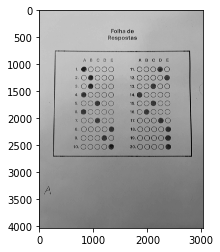

In [358]:
import cv2
import numpy as np
import matplotlib.pyplot as plt

img = cv2.imread('images/A.png')
img = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)

plt.imshow(img, cmap='gray')


#### Filtro bilateral para reduzir o ruído

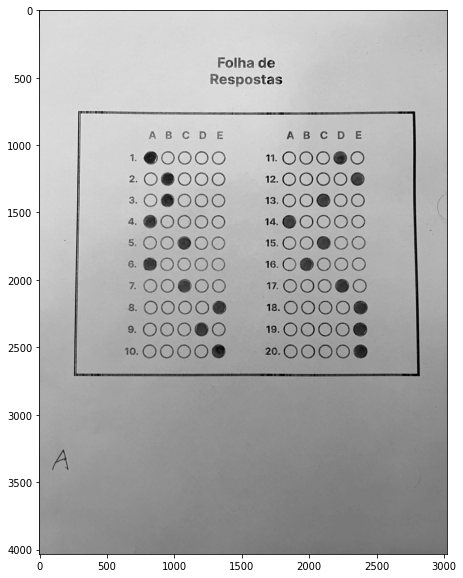

In [372]:

img_blur = cv2.bilateralFilter(img, 9, 75, 75)

plt.figure(figsize=(12, 10))

plt.imshow(img_blur, cmap='gray')


2. Filtro de Canny (detecção de bordas)

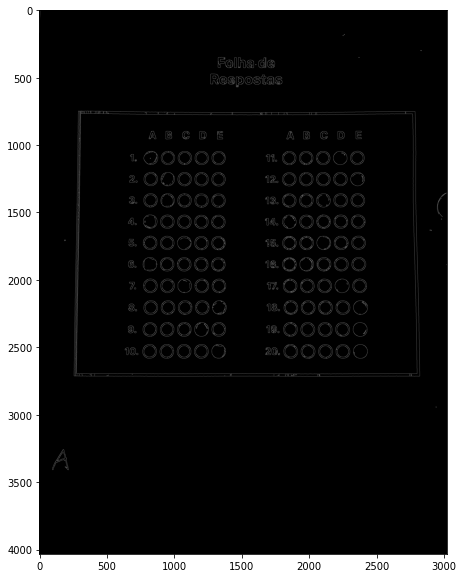

In [360]:
img_canny = cv2.Canny(img_blur, 150, 50)


plt.figure(figsize=(12, 10))
plt.imshow(img_canny, cmap='gray')

#### Thresholding (binarização da imagem)

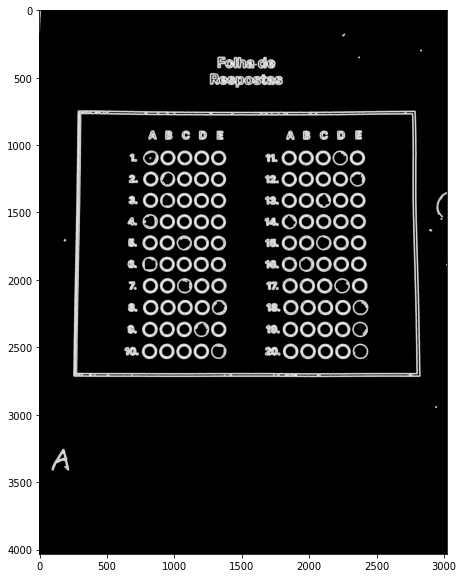

In [361]:
img_thresh = cv2.adaptiveThreshold(img_canny, 255, cv2.ADAPTIVE_THRESH_GAUSSIAN_C, cv2.THRESH_BINARY_INV, 11, 2)


plt.figure(figsize=(12, 10))
plt.imshow(img_thresh, cmap='gray')

### Detecção dos contornos


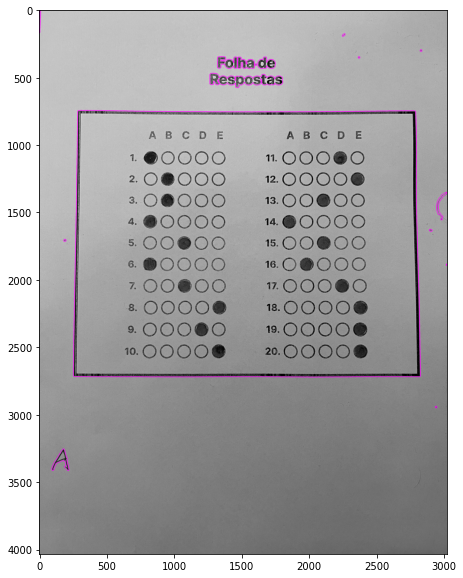

In [373]:

imgContours = img.copy() 
contours, hierarchy = cv2.findContours(img_thresh, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)


imgContours = cv2.cvtColor(imgContours, cv2.COLOR_GRAY2BGR)


cv2.drawContours(imgContours, contours, -1, (255, 0, 255), 3)


plt.figure(figsize=(12, 10))
plt.imshow(imgContours)


In [363]:
print("Number of contours found = " + str(len(contours)))

Number of contours found = 19


#### Contornos externos, ordenados por área

Procuramos por contornos que são aproximadamente retângulos, e com proporção aproximada retangulo do modelo

In [364]:

contours = sorted(contours, key=cv2.contourArea, reverse=True)


for c in contours:
    peri = cv2.arcLength(c, True)
    approx = cv2.approxPolyDP(c, 0.02 * peri, True)

    (x, y, w, h) = cv2.boundingRect(c)
    ar = w / float(h)

    area = cv2.contourArea(c)

    if len(approx) == 4 and ar >= 1.0 and ar <= 1.32:
        print("Found the contour")
        break




Found the contour


#### Transformação de perspectiva e crop

Transformamos a imagem para que encaixe nos 4 cantos do modelo, e cortamos para eliminar a borda 


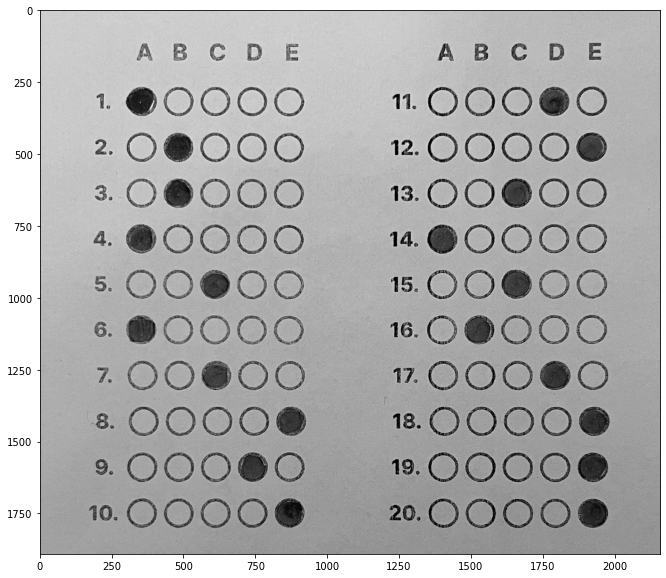

In [365]:

from imutils.perspective import four_point_transform


document = four_point_transform(img, approx.reshape(4, 2))


h, w = document.shape
document = document[int(0.02*h):int(0.98*h), int(0.08*w):int(0.92*w)]


plt.figure(figsize=(12, 10))
plt.imshow(document, cmap='gray')



#### Pré-processamento da imagem recortada
- aplicamos um gaussiano para suavizar a imagem
- binarizamos a imagem
- dilatamos a imagem para preencher os espaços vazios (circulos que não foram fechados)
  

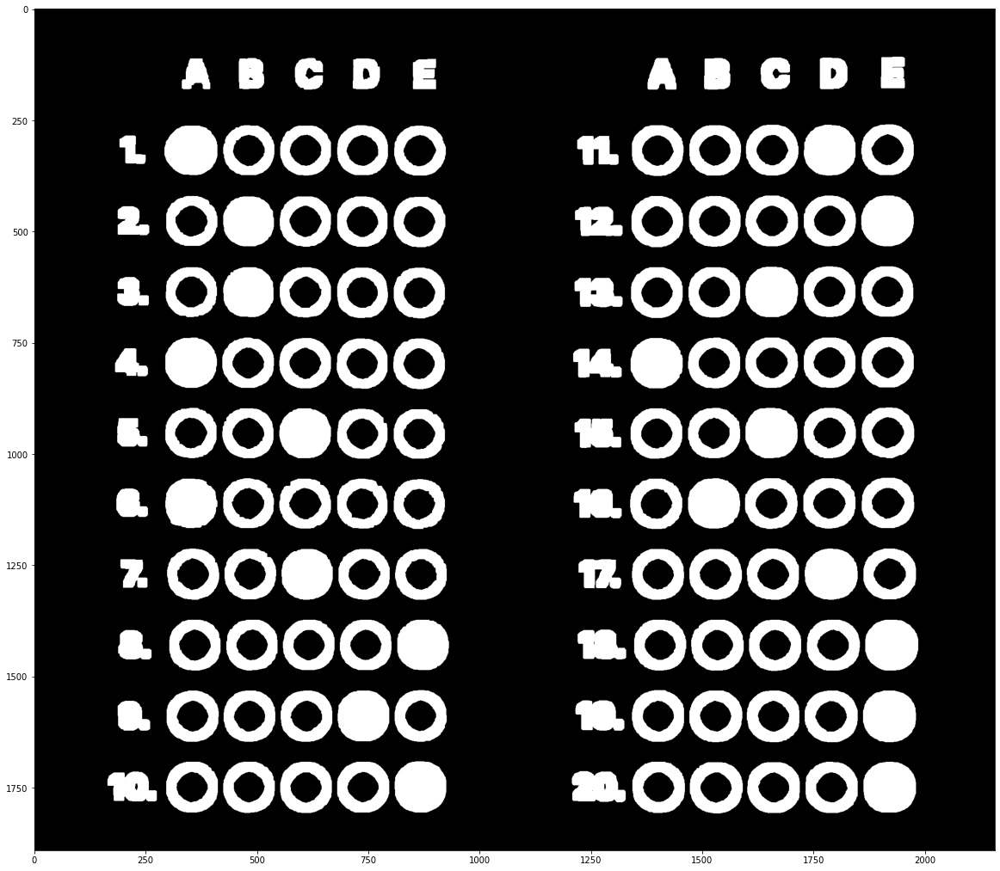

In [366]:
document_blur = cv2.GaussianBlur(document, (7, 7), 0)


doc_thresh = cv2.threshold(document_blur, 0, 255,
	cv2.THRESH_BINARY_INV | cv2.THRESH_OTSU, 
	)[1]


kernel = np.ones((7,7),np.uint8)
doc_thresh = cv2.dilate(doc_thresh,kernel,iterations = 2)


plt.figure(figsize=(20, 20))
plt.imshow(doc_thresh, cmap='gray')


#### Detecção dos contornos da imagem recortada

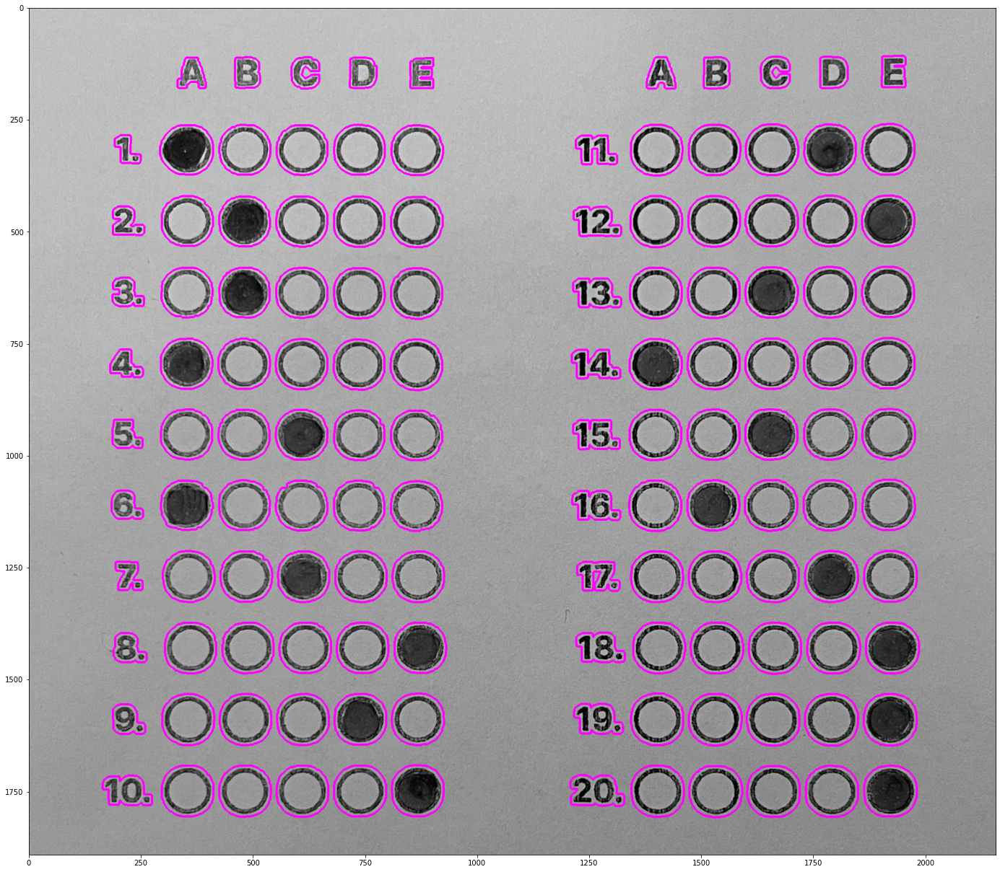

In [367]:
contours = cv2.findContours(doc_thresh.copy(), cv2.RETR_EXTERNAL,
    cv2.CHAIN_APPROX_SIMPLE)[0]



plt.figure(figsize=(24, 40))
plt.imshow(cv2.drawContours(cv2.cvtColor(document.copy(), cv2.COLOR_GRAY2BGR), contours, -1, (255, 0, 255), 3))




### Detecção dos círculos

Filtramos os contornos aproximadamente circulares, e também pelo tamanho do círculo esperado

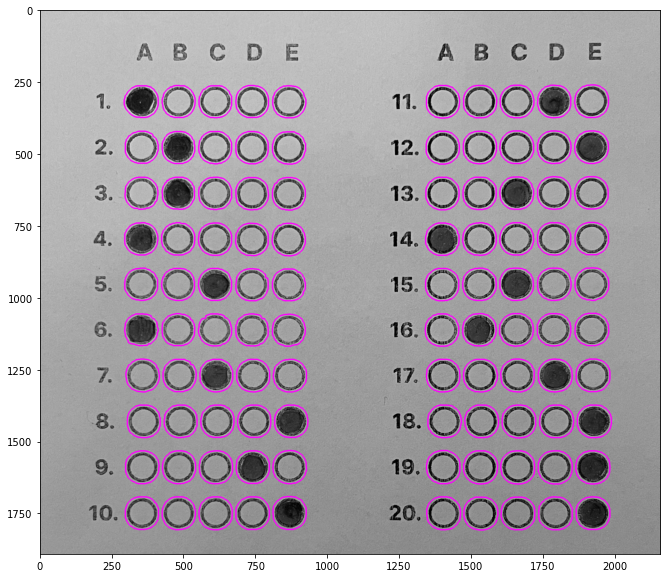

In [368]:



question_cnts = []

MIN_AREA = 4500
MIN_LEN = 60



for c in contours:
    (x, y, w, h) = cv2.boundingRect(c)
    ar = w / float(h)

    area = cv2.contourArea(c)

    peri = cv2.arcLength(c, True)
    approx = cv2.approxPolyDP(c, 0.01 * peri, True)

    if w >= MIN_LEN and h >= MIN_LEN and ar >= 0.8 and ar <= 1.2 and len(approx) > 8 and area > MIN_AREA:
        question_cnts.append(c)



plt.figure(figsize=(12, 10))
plt.imshow(cv2.drawContours(cv2.cvtColor(document.copy(), cv2.COLOR_GRAY2BGR), question_cnts, -1, (255, 0, 255), 3))



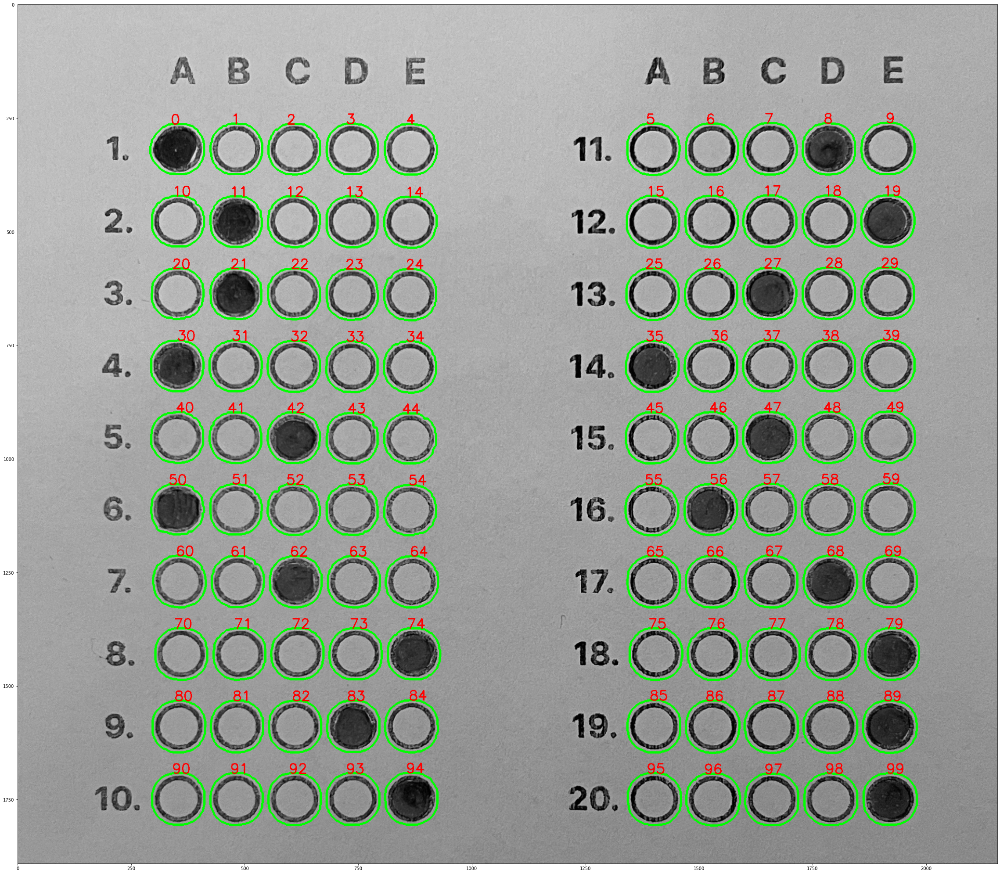

In [374]:
from imutils import contours as imutils_contours

numbered = cv2.cvtColor(document.copy(), cv2.COLOR_GRAY2BGR)


question_cnts = imutils_contours.sort_contours(question_cnts,
    method="top-to-bottom")[0]



grid = []
row = []
for (i, c) in enumerate(question_cnts, 1):
    row.append(c)
    if i % 10 == 0:  
        (cnts, _) = imutils_contours.sort_contours(row, method="left-to-right")
        grid.append(cnts)
        row = []



i = 0
for row in grid:
    for c in row:
        cv2.drawContours(numbered, [c], -1, (0, 255, 0), 3)
        cv2.putText(numbered, str(i), (c[0][0][0], c[0][0][1]), cv2.FONT_HERSHEY_SIMPLEX, 1, (255, 0, 0), 2)
        i += 1



plt.figure(figsize=(40, 50))
plt.imshow(numbered)


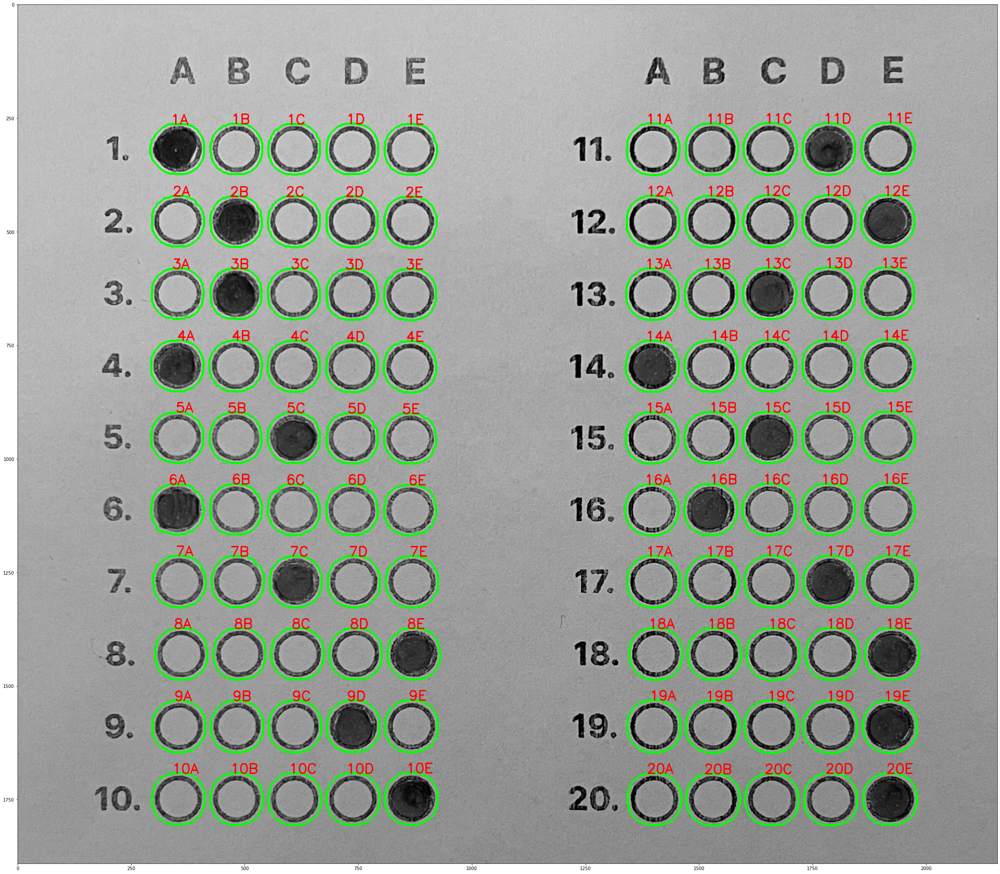

In [370]:
question_grid = []
numbered = cv2.cvtColor(document.copy(), cv2.COLOR_GRAY2BGR)

for (row) in grid:
    question_grid.append(row[:5])
for (row) in grid:
    question_grid.append(row[5:])

for (question_number, row ) in enumerate(question_grid):
    question_number += 1
    for (option_number, c ) in enumerate(row):
        option_letter = chr(ord('A') + option_number)
        cv2.drawContours(numbered, [c], -1, (0, 255, 0), 3)
        cv2.putText(numbered, str(question_number) + option_letter, (c[0][0][0], c[0][0][1]), cv2.FONT_HERSHEY_SIMPLEX, 1, (255, 0, 0), 2)
        


plt.figure(figsize=(40, 50))
plt.imshow(numbered)


### Detecção dos ciculos marcados
Verificamos se a quantidade de pixels brancos do circulo com mais pixels brancos é significativamente maior que a média dos outros circulos.

Assim, consideramos que o circulo com mais pixels brancos é o circulo marcado. 


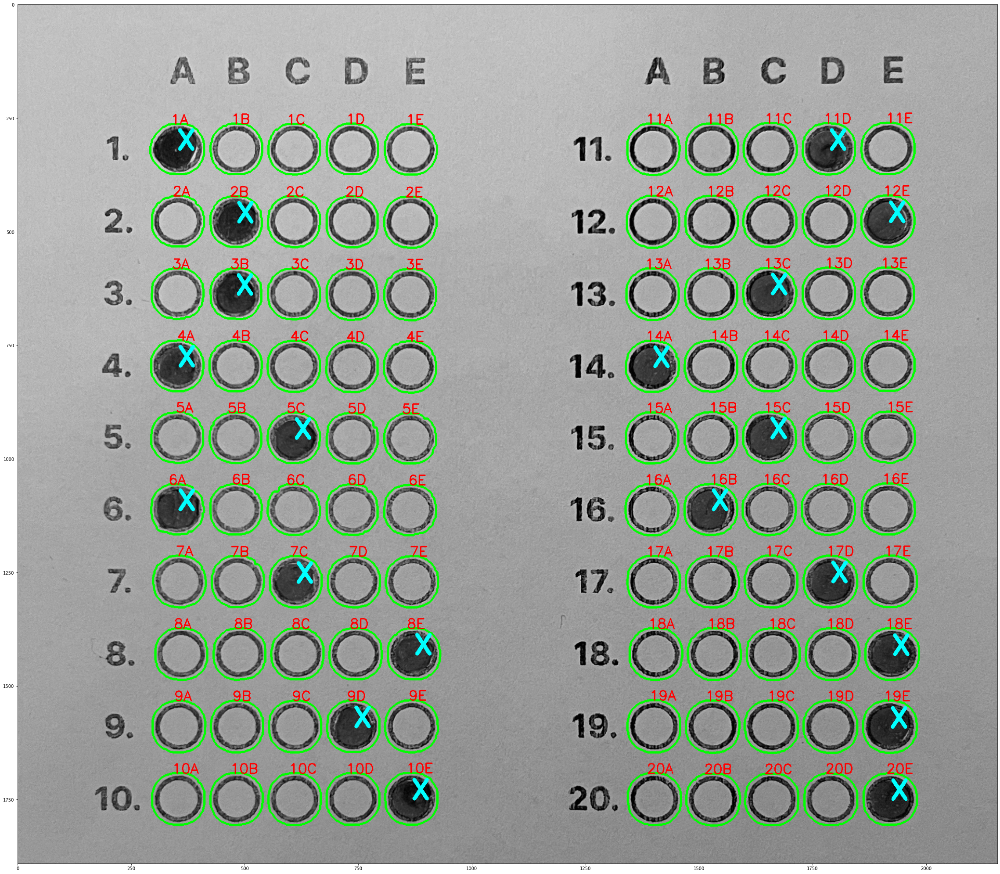

In [371]:

answers = []
answers_contours = []


for question_number, row in enumerate(question_grid):

    current_row_levels = []
    for option_number, c in enumerate(row):

        mask = np.zeros(doc_thresh.shape, dtype="uint8")
        cv2.drawContours(mask, [c], -1, 255, -1)


        mask = cv2.bitwise_and(doc_thresh, doc_thresh, mask=mask)
        total = cv2.countNonZero(mask)


        current_row_levels.append(total)

    max_value = max(current_row_levels)

    max_index = current_row_levels.index(max_value)

    current_row_levels.pop(max_index)


    average = sum(current_row_levels) / len(current_row_levels)


    (x, y, w, h) = cv2.boundingRect(row[max_index])
    x += int(w / 2)
    y += int(h / 2)


    if(max_value > average * 1.2):
        answers_contours.append(c)
        answers.append({
            'question': question_number + 1,
            'marked': chr(ord('A') +  max_index),
            'x': x,
            'y': y,
    })
    else:
        answers.append({
            'question': question_number + 1,
            'marked': 'N/A',
     
    })


for answer in answers:
    if 'marked' in answer and answer['marked'] != 'N/A':

        cv2.putText(numbered, 'X', (answer['x'], answer['y']), cv2.FONT_HERSHEY_SIMPLEX, 2, (0, 255, 255), 8)
        



plt.figure(figsize=(40, 50))
plt.imshow(numbered)

